In [339]:
#imports
import numpy as np

from gpie.imaging.ptychography.data.dataset import PtychographyDataset
from gpie.imaging.ptychography.simulator.probe import generate_probe
from gpie.imaging.ptychography.simulator.scan import generate_fermat_spiral_positions, generate_raster_positions

# load sample image from sk-image library
import os
import sys
EXAMPLES_DIR = os.path.abspath(os.path.join(os.getcwd(), ".."))
sys.path.insert(0, EXAMPLES_DIR)

from io_utils import load_sample_image

In [340]:
# Generate synthetic object and probe

# --- Object (amplitude × phase) ---
obj_shape = (256, 256)
prb_shape = (128, 128)
amp = load_sample_image("moon", shape=obj_shape)
phase = load_sample_image("coins", shape=obj_shape)
obj_true = amp * np.exp(1j * phase)

# --- Probe ---
pixel_size = 0.1  # µm per pixel
prb_true = generate_probe(
    shape=prb_shape,
    pixel_size=pixel_size,
    space = "fourier",
    aperture_radius=0.7,
    smooth_edge_sigma=0.01,
    random_phase = True
)

Generated 50 diffraction patterns.


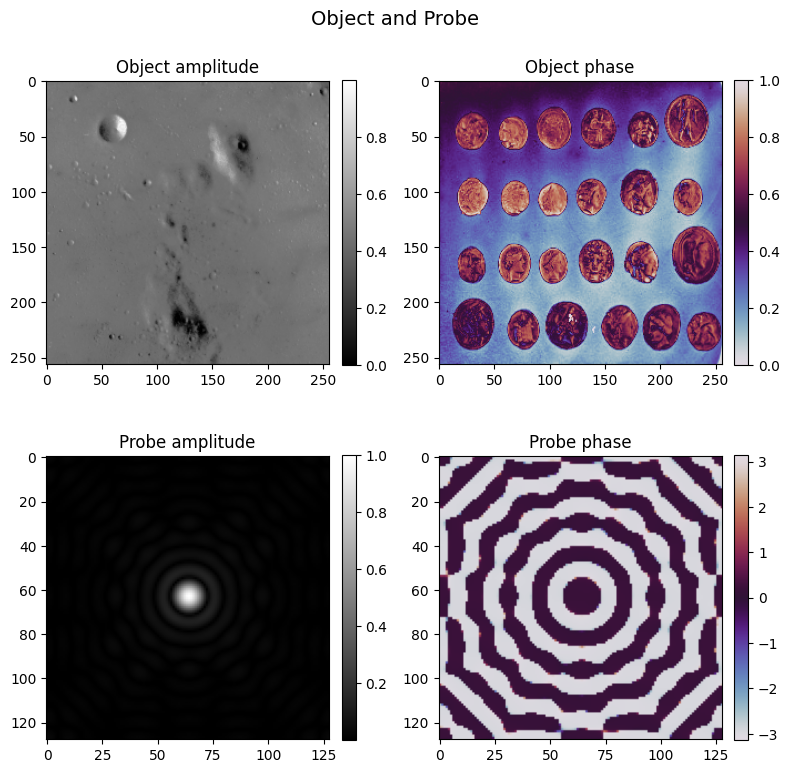

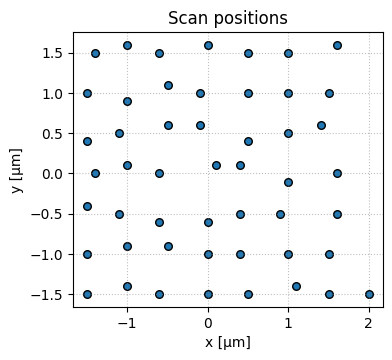

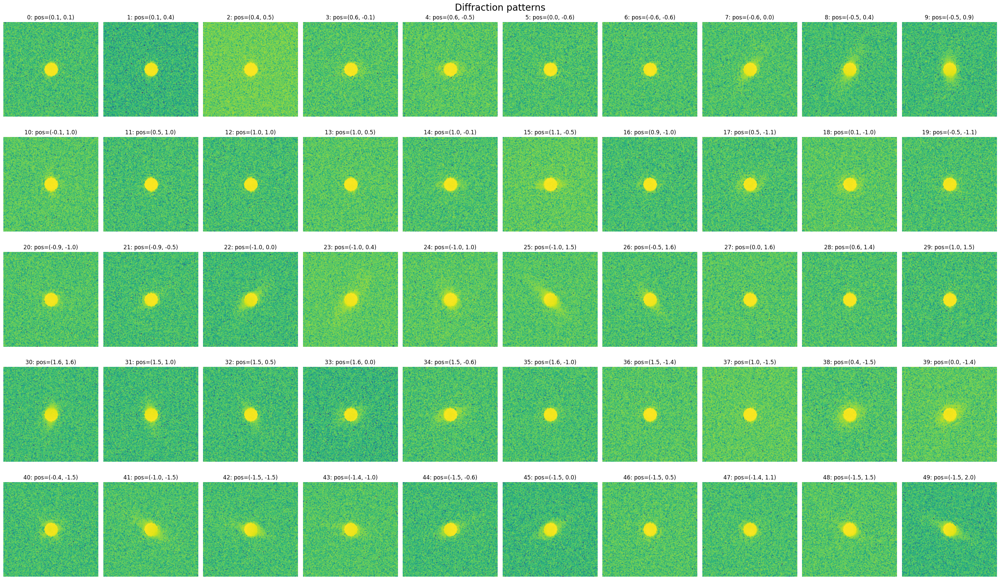

In [341]:
# initialize ptychography dataset
noise = 1e-4
dataset = PtychographyDataset()
dataset.set_pixel_size(pixel_size)
dataset.set_object(obj_true)
dataset.set_probe(prb_true)

# generate scan positions and simulate diffraction

scan_gen = generate_raster_positions(stride_um=0.5, jitter_um=0.05)
dataset.simulate_diffraction(scan_gen, max_num_points=50, noise=noise)

print(f"Generated {dataset.size} diffraction patterns.")

#visualization

# --- Object & Probe ---
fig1 = dataset.show_object_and_probe()

# --- Scan positions ---
fig2 = dataset.show_scan_positions()

# --- Diffraction patterns ---
fig3 = dataset.show_diffraction_patterns(ncols=10)

In [342]:
from gpie import model, replicate, fft2, AmplitudeMeasurement, GaussianPrior, GaussianMeasurement 
from typing import Tuple, List 
@model 
def ptychography_graph_unknown_probe( obj_shape, prb_shape, indices, noise: float, dtype=np.complex64, damping: float = 0.3, ): 
    """Ptychography graph with known probe."""
    obj = ~GaussianPrior(event_shape=obj_shape, label="object", dtype=dtype) 
    prb = ~GaussianPrior(event_shape=prb_shape, label="probe", dtype=dtype) 
    patches = obj.extract_patches(indices) 
    exit_waves = prb * patches 
    AmplitudeMeasurement(var=noise, label="meas", damping=damping) << fft2(exit_waves)
    #GaussianMeasurement(var = noise) << fft2(exit_waves) 
    return

In [343]:
graph2 = ptychography_graph_unknown_probe(
    obj_shape=obj_shape,
    prb_shape = prb_shape,
    indices=[d.indices for d in dataset],
    noise=noise
)

graph2.get_wave("object").set_sample(obj_true)
graph2.get_wave("probe").set_sample(prb_true)
graph2.generate_sample(rng=np.random.default_rng(seed=999), update_observed=True)

In [344]:
graph2.set_init_rng(np.random.default_rng(seed=1))
graph2.run(n_iter=100, callback=None)

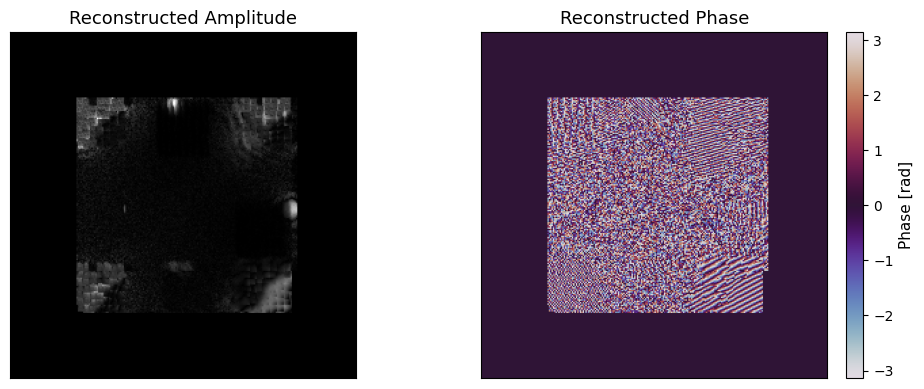

In [345]:
from matplotlib import pyplot as plt
import numpy as np

# Retrieve reconstructed object
recon = graph2.get_wave("object").compute_belief().data[0]
amp = np.abs(recon)
phase = np.angle(recon)

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
titles = ["Reconstructed Amplitude", "Reconstructed Phase"]
images = [
    axes[0].imshow(amp, cmap="gray"),
    axes[1].imshow(phase, cmap="twilight", vmin=-np.pi, vmax=np.pi),
]

for ax, title in zip(axes, titles):
    ax.set_title(title, fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("equal")

# Add colorbar only to phase
cbar = fig.colorbar(images[1], ax=axes[1], fraction=0.046, pad=0.04)
cbar.set_label("Phase [rad]", fontsize=11)

plt.tight_layout()
plt.show()

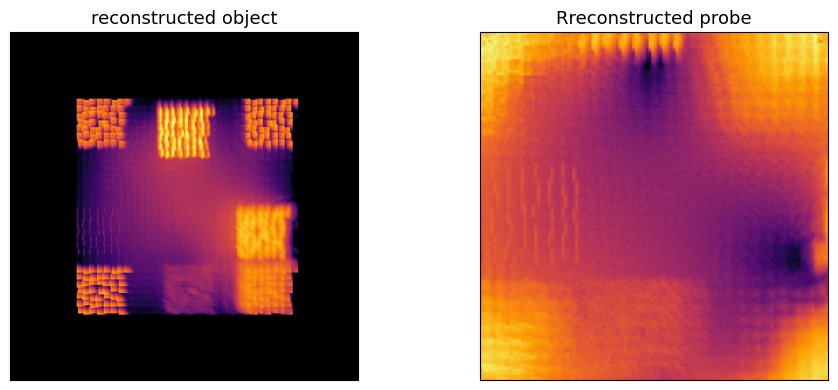

In [346]:
from matplotlib import pyplot as plt
import numpy as np

# Retrieve reconstructed object
precision_obj = graph2.get_wave("object").compute_belief().precision()[0]

precision_prb = graph2.get_wave("probe").compute_belief().precision()[0]

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
titles = ["reconstructed object", "Rreconstructed probe"]
images = [
    axes[0].imshow(np.log10(precision_obj+1e-8), cmap="inferno"),
    axes[1].imshow(np.log10(precision_prb+1e-8), cmap="inferno"),
]

for ax, title in zip(axes, titles):
    ax.set_title(title, fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("equal")

plt.tight_layout()
plt.show()

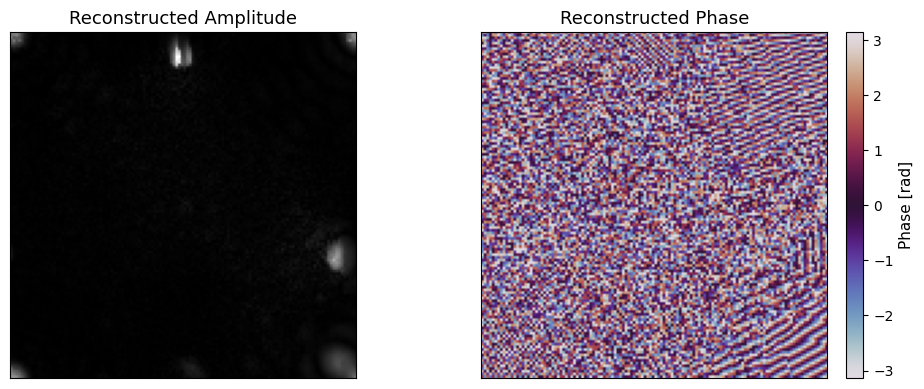

In [347]:
from matplotlib import pyplot as plt
import numpy as np

# Retrieve reconstructed object
recon = graph2.get_wave("probe").compute_belief().data[0]
amp = np.abs(recon)
phase = np.angle(recon)

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
titles = ["Reconstructed Amplitude", "Reconstructed Phase"]
images = [
    axes[0].imshow(amp, cmap="gray"),
    axes[1].imshow(phase, cmap="twilight", vmin=-np.pi, vmax=np.pi),
]

for ax, title in zip(axes, titles):
    ax.set_title(title, fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("equal")

# Add colorbar only to phase
cbar = fig.colorbar(images[1], ax=axes[1], fraction=0.046, pad=0.04)
cbar.set_label("Phase [rad]", fontsize=11)

plt.tight_layout()
plt.show()